In [ ]:
!pip install mediapipe opencv-python-headless matplotlib

In [ ]:
import cv2
import mediapipe as mp
import numpy as np
import math
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

In [ ]:
# Uploading video
from google.colab import files
import os

uploaded = files.upload()

# Get the uploaded file name
video_path = list(uploaded.keys())[0]
print(f"Uploaded video: {video_path}")

if os.path.exists(video_path):
    print("Video uploaded successfully!")
else:
    raise FileNotFoundError("Video not found!")


Saving squats.mp4 to squats.mp4
Uploaded video: squats.mp4
Video uploaded successfully!


Displaying a frame from the video:


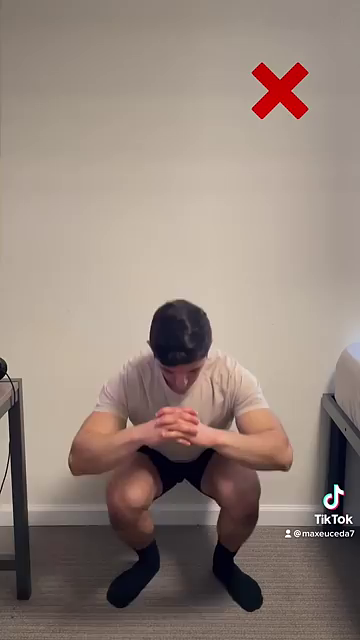

In [ ]:
# Open the video using OpenCV
cap = cv2.VideoCapture(video_path)

# Read a single frame to check the video
ret, frame = cap.read()

if ret:
    print("Displaying a frame from the video:")
    cv2_imshow(frame)  # Display the frame in Google Colab
else:
    print("Error reading the video!")

cap.release()


In [ ]:
mp_pose = mp.solutions.pose  # Mediapipe Pose module
mp_drawing = mp.solutions.drawing_utils  # For drawing landmarks

In [ ]:
# Function to detect and draw pose landmarks
def detect_pose(video_path):
    cap = cv2.VideoCapture(video_path)  # Open the video
    pose = mp_pose.Pose(static_image_mode=False, min_detection_confidence=0.5, min_tracking_confidence=0.5)

    # Process video frames
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break  # Exit the loop if video ends

        # Convert the image to RGB as Mediapipe requires RGB format
        image_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        results = pose.process(image_rgb)  # Detect pose landmarks

        # Draw the pose landmarks if detected
        if results.pose_landmarks:
            mp_drawing.draw_landmarks(frame, results.pose_landmarks, mp_pose.POSE_CONNECTIONS)

        # Display the frame with landmarks
        cv2_imshow(frame)

    cap.release()
    pose.close()
    print("Pose detection complete!")


In [ ]:
detect_pose(video_path)

In [ ]:
# Function to calculate angles between three points
def calculate_angle(a, b, c):
    """
    Calculate the angle at point 'b' (knee) using three points:
    a - hip
    b - knee
    c - ankle
    """
    a = np.array(a)  # Hip
    b = np.array(b)  # Knee
    c = np.array(c)  # Ankle

    # Vector calculations
    ab = a - b
    cb = c - b

    # Dot product and magnitude
    cosine_angle = np.dot(ab, cb) / (np.linalg.norm(ab) * np.linalg.norm(cb))
    angle = np.degrees(np.arccos(np.clip(cosine_angle, -1.0, 1.0)))

    return angle

In [ ]:
# Function to process video and calculate knee angles
def detect_pose_with_angles(video_path):
    cap = cv2.VideoCapture(video_path)
    pose = mp_pose.Pose(static_image_mode=False, min_detection_confidence=0.5, min_tracking_confidence=0.5)

    knee_angles = []  # To store knee bend angles

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        # Convert to RGB for Mediapipe
        image_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        results = pose.process(image_rgb)

        if results.pose_landmarks:
            landmarks = results.pose_landmarks.landmark

            # Extract key points (left knee, hip, ankle)
            left_hip = [landmarks[mp_pose.PoseLandmark.LEFT_HIP.value].x, landmarks[mp_pose.PoseLandmark.LEFT_HIP.value].y]
            left_knee = [landmarks[mp_pose.PoseLandmark.LEFT_KNEE.value].x, landmarks[mp_pose.PoseLandmark.LEFT_KNEE.value].y]
            left_ankle = [landmarks[mp_pose.PoseLandmark.LEFT_ANKLE.value].x, landmarks[mp_pose.PoseLandmark.LEFT_ANKLE.value].y]

            # Calculate angle at the knee
            knee_angle = calculate_angle(left_hip, left_knee, left_ankle)
            knee_angles.append(knee_angle)

            # Display angle on the frame
            cv2.putText(frame, f"Knee Angle: {int(knee_angle)}",
                        (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2, cv2.LINE_AA)

            # Draw landmarks
            mp_drawing.draw_landmarks(frame, results.pose_landmarks, mp_pose.POSE_CONNECTIONS)

        # Display the frame with landmarks and angles
        cv2_imshow(frame)

    cap.release()
    pose.close()
    print("Knee bend angle calculation complete!")

    return knee_angles


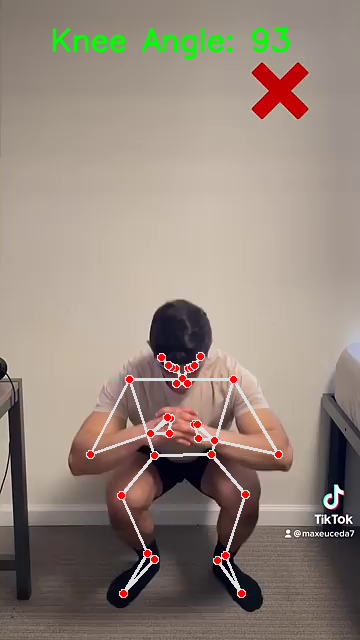

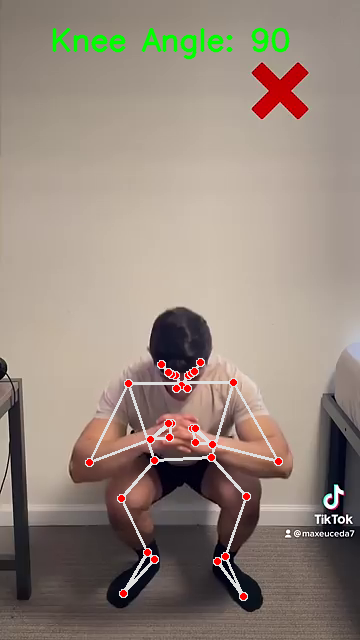

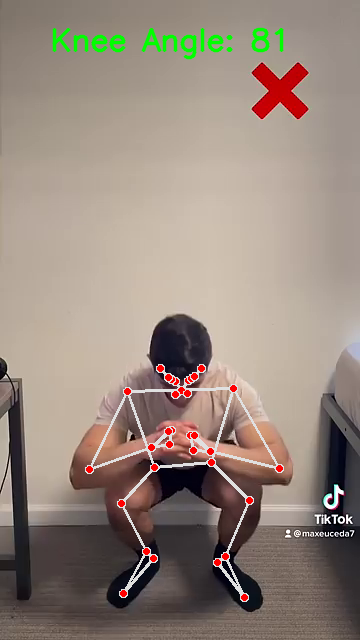

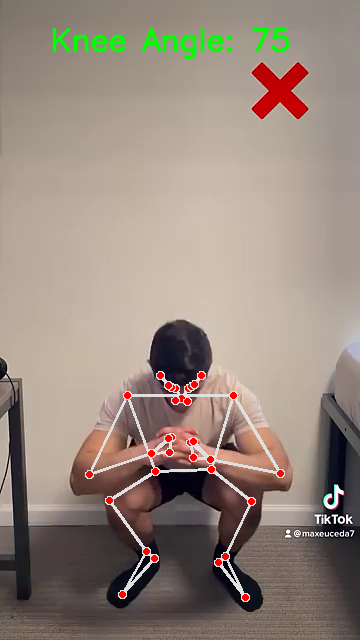

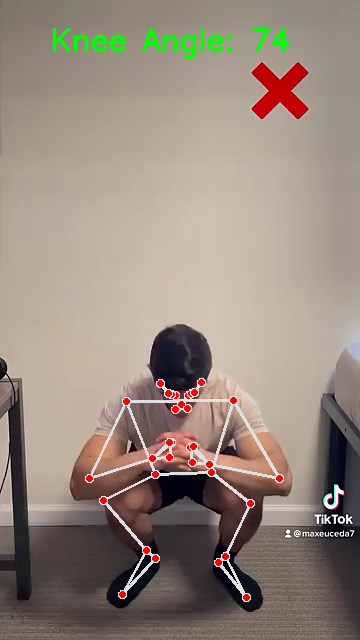

...

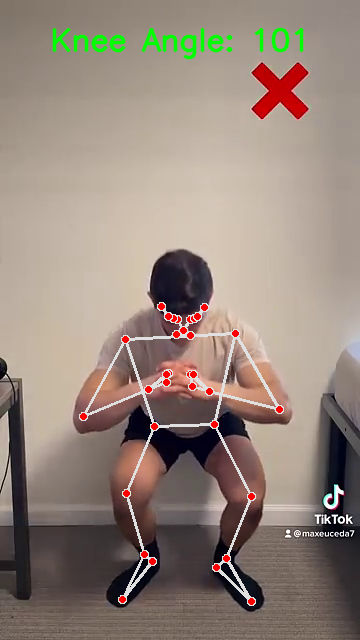

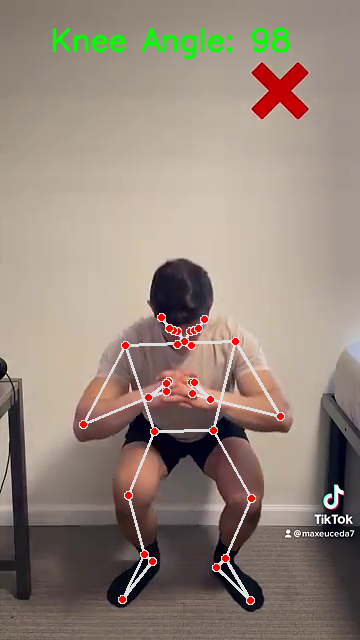

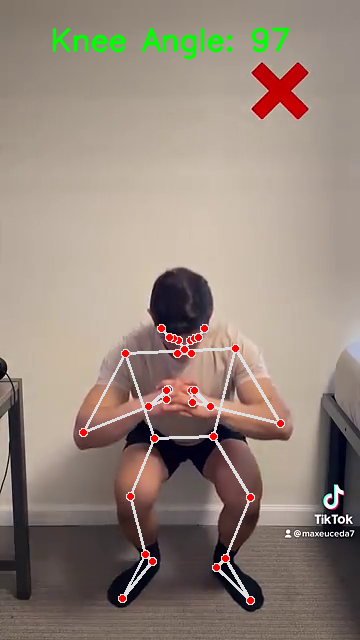

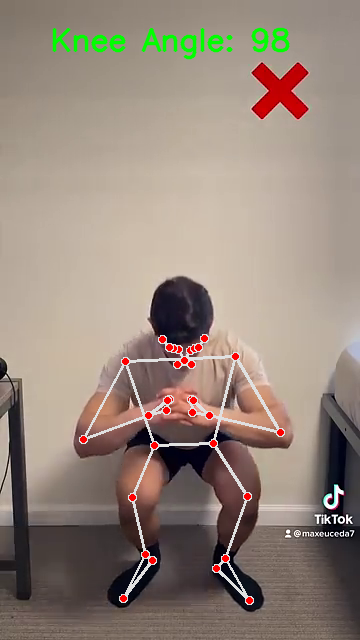

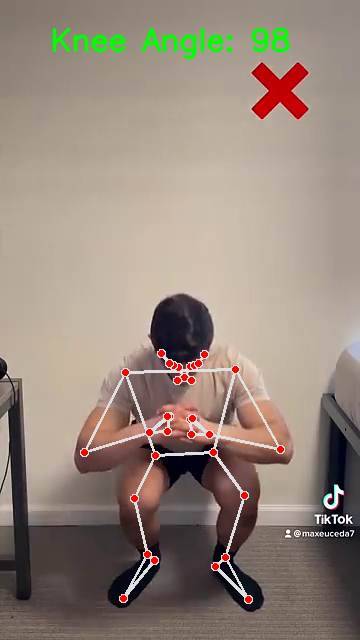

Knee bend angle calculation complete!


In [ ]:
knee_angles = detect_pose_with_angles(video_path)

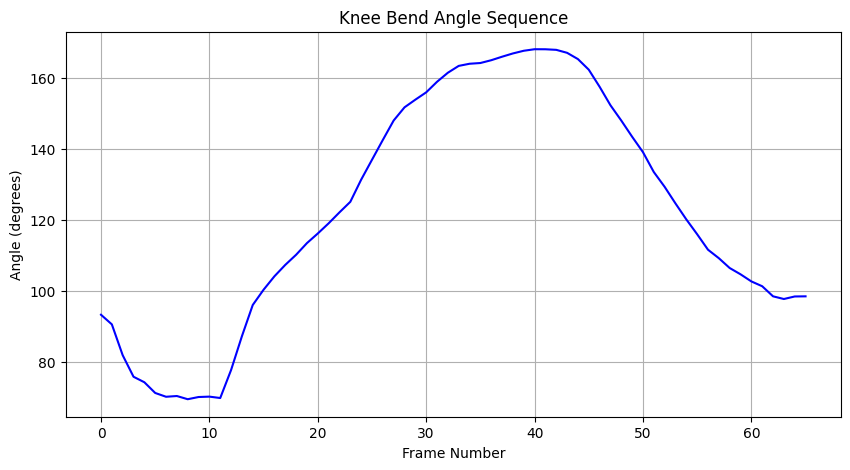

In [ ]:
# Plot for knee bend angles
plt.figure(figsize=(10, 5))
plt.plot(knee_angles, color='b')
plt.title("Knee Bend Angle Sequence")
plt.xlabel("Frame Number")
plt.ylabel("Angle (degrees)")
plt.grid()
plt.show()